# Libraries

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import scipy.stats as st
from scipy.stats import linregress
from config import gkey
import gmaps
import ipywidgets as widgets
from ipywidgets.embed import embed_minimal_html
import seaborn as sns
import plotly.express as px
import re
import gmaps.geojson_geometries
from matplotlib.cm import viridis
from matplotlib.cm import Spectral
from matplotlib.colors import to_hex
import country_converter as coco

# Import datasets

In [2]:
covid_stats_df =  pd.read_csv("resources/covid_stats_2020.csv")
covid_stats_df.head()

,standard_names,ISO_2,ISO_3,Population (2020),lat,lng,Density (P/Km²),Confirmed,stringency_index,Infection_rate_f
0,Afghanistan,AF,AFG,39074280,33.939110,67.709953,60,46274.0,42.700514,0.1183
1,Albania,AL,ALB,2877239,41.153332,20.168331,105,52004.0,55.330056,1.8074
2,Algeria,DZ,DZA,43984569,28.033886,1.659626,18,94371.0,59.981444,0.2146
3,Andorra,AD,AND,77287,42.506285,1.521801,164,7519.0,40.286864,9.7286
4,Angola,AO,AGO,33032075,-11.202692,17.873887,26,16562.0,57.541104,0.0502


In [3]:
ultimate_no_null_df = pd.read_csv("resources/ultimate_no_null.csv")
ultimate_no_null_df.head()

,standard_names,month,year,Confirmed,stringency_index,lat,lng,Population (2020),Density (P/Km²),Infection_rate,ISO_2,ISO_3,Infection_rate_f
0,Afghanistan,1,2020,0.0,0.000000,33.93911,67.709953,39074280,60,0.0000%,AF,AFG,0.0000
1,Afghanistan,2,2020,1.0,2.010690,33.93911,67.709953,39074280,60,0.0000%,AF,AFG,0.0000
2,Afghanistan,3,2020,174.0,40.831935,33.93911,67.709953,39074280,60,0.0004%,AF,AFG,0.0004
3,Afghanistan,4,2020,1952.0,80.740000,33.93911,67.709953,39074280,60,0.0050%,AF,AFG,0.0050
4,Afghanistan,5,2020,13081.0,84.260000,33.93911,67.709953,39074280,60,0.0335%,AF,AFG,0.0335


In [4]:
sample = pd.read_csv("resources/samples.csv")
sample.head()

,standard_names,ISO_2,ISO_3,Population (2020),lat,lng,Density (P/Km²),Confirmed,stringency_index,Infection_rate_f
0,United States,US,USA,331341050,37.090240,-95.712891,36,17459296.0,56.045880,5.2692
1,India,IN,IND,1382345085,20.593684,78.962880,464,9462809.0,62.869497,0.6845
2,Brazil,BR,BRA,212821986,-14.235004,-51.925280,25,7162978.0,56.761687,3.3657
3,China,CN,CHN,1440297825,35.861660,104.195397,153,6665209.0,68.391841,0.4628
4,France,FR,FRA,65298930,46.227638,2.213749,119,5352449.0,55.223795,8.1966


In [5]:
populations_df = pd.read_csv("resources/population_standardized_2020.csv")
populations_df.head()

,standard_names,Population (2020),Net Change,Density (P/Km²),Land Area (Km²),Migrants (net),Fert. Rate,Med. Age,Urban Pop %,Yearly Change %,World Share %
0,China,1440297825,5540090,153,9388211,-348399.0,1.7,38,61.0,0.39,18.47
1,India,1382345085,13586631,464,2973190,-532687.0,2.2,28,35.0,0.99,17.70
2,United States,331341050,1937734,36,9147420,954806.0,1.8,38,83.0,0.59,4.25
3,Indonesia,274021604,2898047,151,1811570,-98955.0,2.3,30,56.0,1.07,3.51
4,Pakistan,221612785,4327022,287,770880,-233379.0,3.6,23,35.0,2.00,2.83


In [6]:
final_df = pd.merge(covid_stats_df, populations_df[['standard_names', 'Migrants (net)', 'Med. Age',\
                                                    'Urban Pop %']], on = 'standard_names',\
                   how = 'inner')
final_df.head()

,standard_names,ISO_2,ISO_3,Population (2020),lat,lng,Density (P/Km²),Confirmed,stringency_index,Infection_rate_f,Migrants (net),Med. Age,Urban Pop %
0,Afghanistan,AF,AFG,39074280,33.939110,67.709953,60,46274.0,42.700514,0.1183,-62920.0,18,25.0
1,Albania,AL,ALB,2877239,41.153332,20.168331,105,52004.0,55.330056,1.8074,-14000.0,36,63.0
2,Algeria,DZ,DZA,43984569,28.033886,1.659626,18,94371.0,59.981444,0.2146,-10000.0,29,73.0
3,Angola,AO,AGO,33032075,-11.202692,17.873887,26,16562.0,57.541104,0.0502,6413.0,17,67.0
4,Argentina,AR,ARG,45267449,-38.416097,-63.616672,17,1531374.0,71.199127,3.3829,4800.0,32,93.0


In [7]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165 entries, 0 to 164
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   standard_names     165 non-null    object 
 1   ISO_2              165 non-null    object 
 2   ISO_3              165 non-null    object 
 3   Population (2020)  165 non-null    int64  
 4   lat                165 non-null    float64
 5   lng                165 non-null    float64
 6   Density (P/Km²)    165 non-null    int64  
 7   Confirmed          165 non-null    float64
 8   stringency_index   165 non-null    float64
 9   Infection_rate_f   165 non-null    float64
 10  Migrants (net)     165 non-null    float64
 11  Med. Age           165 non-null    int64  
 12  Urban Pop %        162 non-null    float64
dtypes: float64(7), int64(3), object(3)
memory usage: 18.0+ KB


# Correlation heatmap

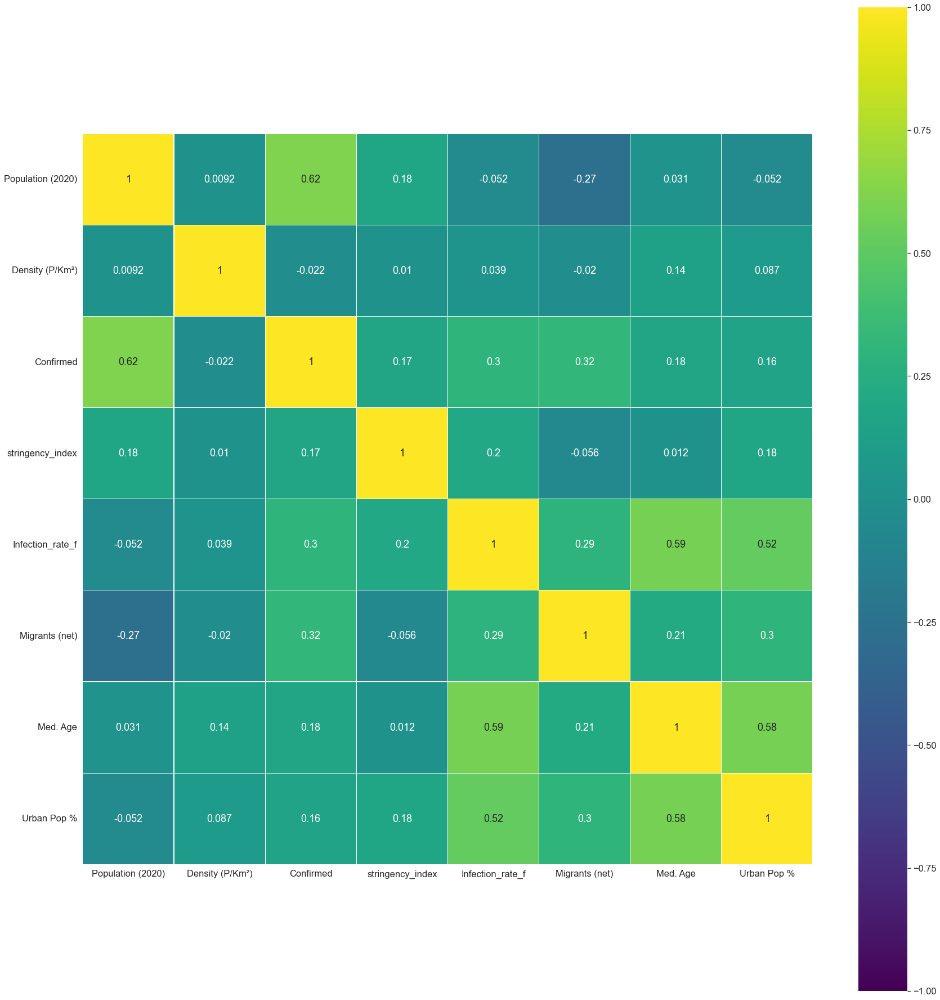

In [8]:
corr = final_df.drop(['lat', 'lng'], axis =1).corr()
plt.figure(figsize=(25, 25))
sns.set(font_scale=1.5)
sns.heatmap(corr
#             [(corr >= 0.6) | (corr <= -0.6)]
            , 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 18}, square=True);
plt.yticks(rotation=0)
plt.savefig("outputs/correlation_heatmap.png")
plt.tight_layout()

# Pair plot

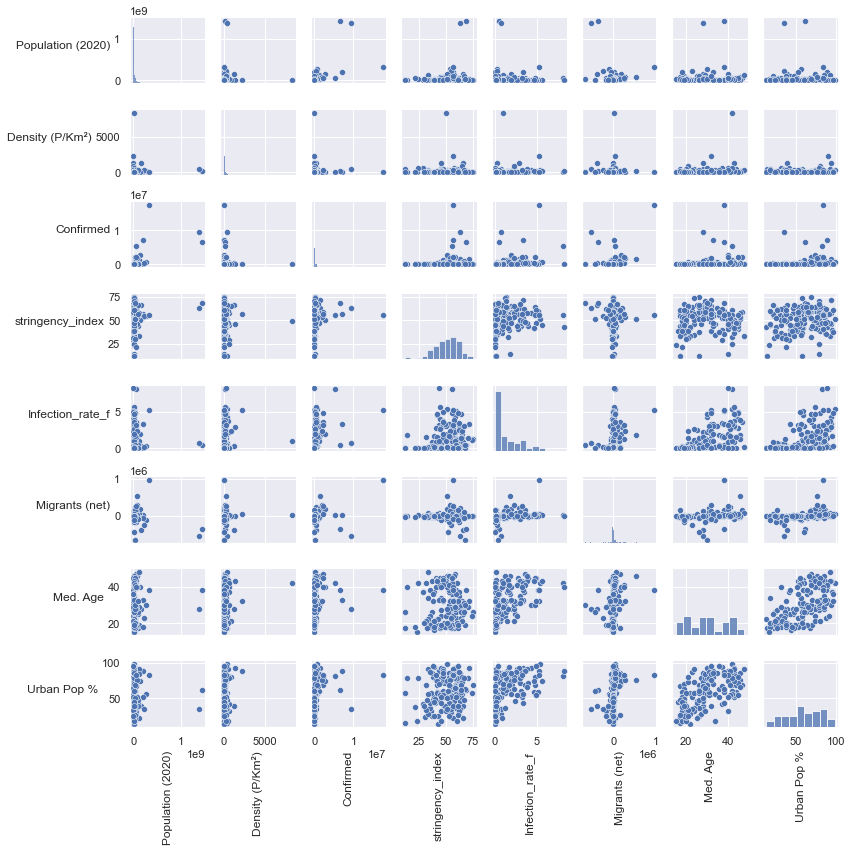

In [9]:
# Create the default pairplot using seaborn
sns.set(font_scale=1)
g =sns.pairplot(final_df.drop(['lat', 'lng'], axis =1), height =1.5)
for ax in g.axes.flat:
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
plt.tight_layout()
plt.savefig('outputs/pairplot_all.png', facecolor='w')
plt.show()

# Boxplots

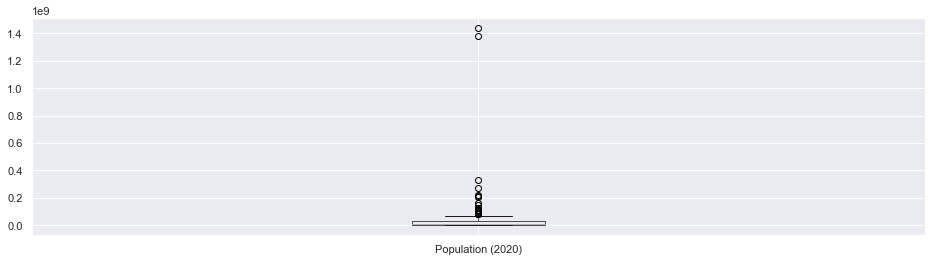

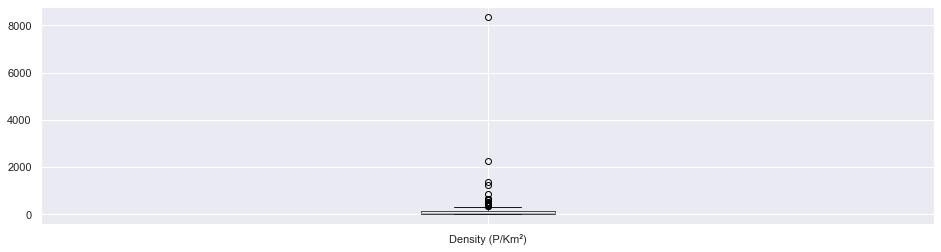

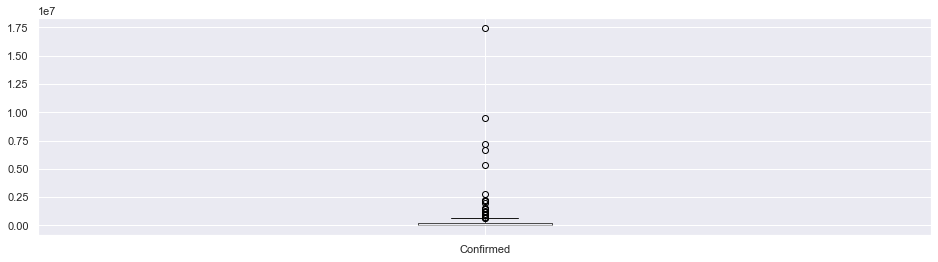

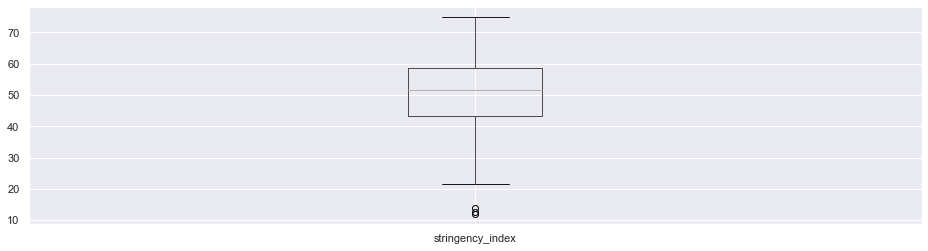

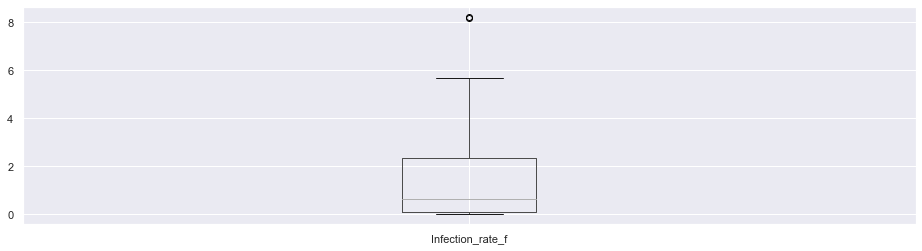

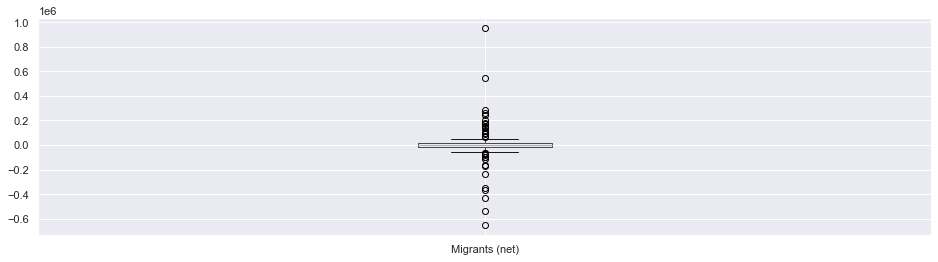

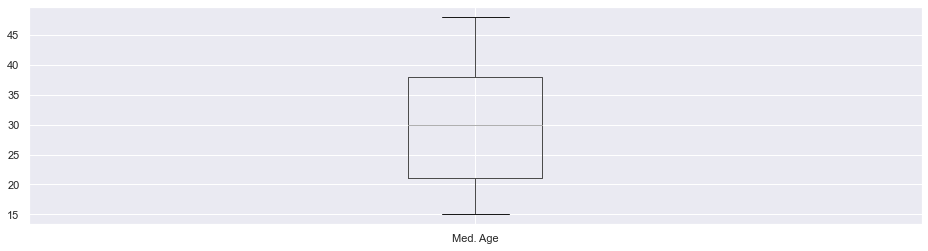

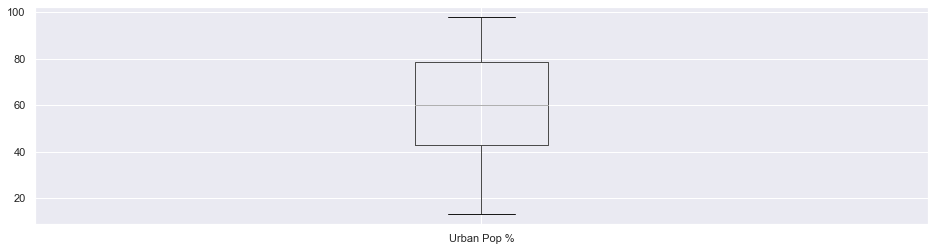

In [10]:
for column in final_df.drop(['standard_names', 'ISO_2', 'ISO_3','lat', 'lng'], axis =1):
    plt.figure(figsize = (16,4))
    final_df.boxplot([column])

# Scatter plots with linear regression using plotly

In [11]:
fig = px.scatter(final_df, x=final_df['stringency_index'], y=final_df['Infection_rate_f'],\
                 trendline="ols", trendline_color_override="red", hover_data = ['standard_names'])
fig.show()

In [12]:
fig = px.scatter(final_df, x=final_df['Urban Pop %'], y=final_df['Infection_rate_f'],\
                 trendline="ols", trendline_color_override="red", hover_data = ['standard_names'])
fig.show()

In [13]:
fig = px.scatter(final_df, x=final_df['Med. Age'], y=final_df['Infection_rate_f'],\
                 trendline="ols", trendline_color_override="red", hover_data = ['standard_names'])
fig.show()

In [14]:
fig = px.scatter(final_df, x=final_df['Density (P/Km²)'], y=final_df['Infection_rate_f'],\
                 trendline="ols", trendline_color_override="red", hover_data = ['standard_names'])
fig.show()

# Heatmap by gmaps

In [15]:
# Configure gmaps
gmaps.configure(api_key=gkey)

# Store latitude and longitude in locations
locations = covid_stats_df[["lat", "lng"]]

# Store Confirmed in Confirmed series
confirmed = covid_stats_df["Confirmed"].astype(float)

# Calculating the max Confirmed for heatmap
max_infection = confirmed.max()

In [16]:
# Plot Heatmap
fig = gmaps.figure()

info_box_template = """
<dl>
<dt>Name</dt><dd>{standard_names}</dd>
<dt>Confirmed</dt><dd>{Confirmed}</dd>
<dt>Population</dt><dd>{Population (2020)}</dd>
<dt>Infection rate</dt><dd>{Infection_rate_f}</dd>
</dl>
"""
sample_info = [info_box_template.format(**row) for index, row in covid_stats_df.iterrows()]
sample_locations = covid_stats_df[["lat", "lng"]]
markers = gmaps.marker_layer(sample_locations, info_box_content = sample_info, display_info_box = True)
symbol_layer = gmaps.symbol_layer(sample_locations, info_box_content=sample_info, fill_color='red',\
                                  hover_text=covid_stats_df['standard_names'],\
                                 stroke_opacity = 0, fill_opacity = 0)
# Create heat layer
heatmap_layer = gmaps.heatmap_layer(locations, weights=confirmed, max_intensity=1000000,
                                    point_radius=5.0, dissipating = False)

# Add layer
fig.add_layer(heatmap_layer)
# fig.add_layer(markers)
fig.add_layer(symbol_layer)
# Display figure
fig

Figure(layout=FigureLayout(height='420px'))

In [17]:
# Export the map in an interactive HTML file
embed_minimal_html("outputs/covid_heatmap_gmaps.html", views=[fig])

# Plotly world map

In [18]:
fig = px.choropleth(covid_stats_df[["standard_names", "ISO_3", "Confirmed"]], locations="ISO_3",
                    color="Confirmed", 
                    hover_name="standard_names", # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Rainbow)
fig.write_html("outputs/covid_world_plotly.html")
fig.show()

# GeoJSON layer

In [19]:
covid_dict = covid_stats_df[["standard_names", "Confirmed"]].set_index('standard_names').to_dict('dict')
countries_geojson = gmaps.geojson_geometries.load_geometry('countries')

min_con = min(covid_dict["Confirmed"].keys(), key=(lambda k: covid_dict["Confirmed"][k]))
max_con = max(covid_dict["Confirmed"].keys(), key=(lambda k: covid_dict["Confirmed"][k]))
con_range = covid_dict["Confirmed"][max_con] - covid_dict["Confirmed"][min_con]

def calculate_color(con):
    """
    Convert the confirmed count to a color
    """
    # make gini a number between 0 and 1
    normalized_con = (con - covid_dict["Confirmed"][min_con]) / con_range

    # invert gini so that high inequality gives dark color
    inverse_con = 1.0 - normalized_con

    # transform the gini coefficient to a matplotlib color
    mpl_color = Spectral(inverse_con)

    # transform from a matplotlib color to a valid CSS color
    gmaps_color = to_hex(mpl_color, keep_alpha=False)

    return gmaps_color

In [20]:
colors = []
for feature in countries_geojson['features']:
    country_name = coco.convert(names=feature['properties']['name'], to='name_short')
    try:
        con = covid_dict["Confirmed"][country_name]
        color = calculate_color(con)
    except KeyError:
        # no cases for that country: return default color
        color = (0, 0, 0, 0.3)
    colors.append(color)

Baykonur Cosmodrome not found in regex
Siachen Glacier not found in regex


In [21]:
info_box_template = """
<dl>
<dt>Name</dt><dd>{standard_names}</dd>
<dt>Confirmed</dt><dd>{Confirmed}</dd>
<dt>Population</dt><dd>{Population (2020)}</dd>
<dt>Infection rate</dt><dd>{Infection_rate_f}</dd>
</dl>
"""
sample_info = [info_box_template.format(**row) for index, row in covid_stats_df.iterrows()]
sample_locations = covid_stats_df[["lat", "lng"]]
markers = gmaps.marker_layer(sample_locations, info_box_content = sample_info)
symbol_layer = gmaps.symbol_layer(sample_locations, info_box_content=sample_info, fill_color='red',\
                                  hover_text=covid_stats_df['standard_names'],\
                                 stroke_opacity = 0, fill_opacity = 0)
fig = gmaps.figure(layout={
        'border': '1px solid black'
})
borders = gmaps.geojson_layer(
    countries_geojson,
    fill_color=colors,
    stroke_color=colors,
    fill_opacity=0.8)
fig.add_layer(borders)
fig.add_layer(symbol_layer)
fig

Figure(layout=FigureLayout(border='1px solid black', height='420px'))

In [22]:
# Export the map in an interactive HTML file
embed_minimal_html("outputs/Covid_geojson.html", views=[fig])

# Horizontal Bar plot

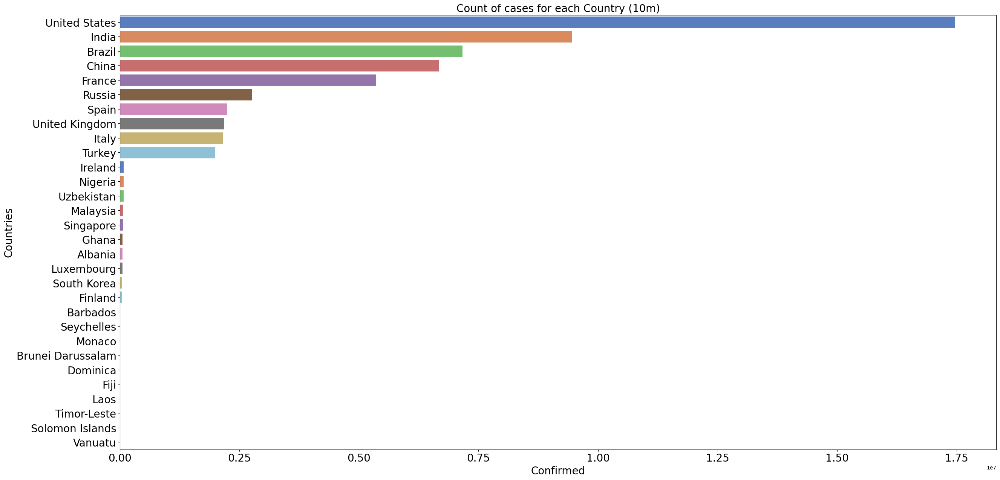

In [23]:
plt.rcdefaults()
plt.figure(figsize=(30,15))
ax = sns.barplot(x="Confirmed", y="standard_names", data=sample, palette = "muted")
ax.set_title('Count of cases for each Country (10m)', fontsize=20)
plt.xlabel('Confirmed', fontsize = 20)
plt.ylabel("Countries", fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.savefig("outputs/bar_chart_covid_cases.png")
plt.show()

# Correlation coefficients for all countries on a bar plot

In [24]:
country = list(set(ultimate_no_null_df["standard_names"]))
country.sort()
corrcoef = []
p_value = []
r_value = []

for name in range(len(country)):
    x = ultimate_no_null_df["stringency_index"].loc[ultimate_no_null_df["standard_names"] == country[name]]
    y = ultimate_no_null_df["Infection_rate"].loc[ultimate_no_null_df["standard_names"] == country[name]]\
            .str.rstrip('%').astype('float')
    corrcoef.append(round(st.pearsonr(x, y)[0],4))
    (slope, intercept, rvalue, pvalue, stderr) = linregress(x, y)
    p_value.append(pvalue)
    r_value.append(rvalue)
    
country_r_value_df = pd.DataFrame({"standard_names" : country,
                                  "corrcoef" : corrcoef,
                                  "p_value" : p_value,
                                  "r_value" : r_value})
country_r_value_df.head(-5)

,standard_names,corrcoef,p_value,r_value
0,Afghanistan,0.6253,0.039633,0.625339
1,Albania,0.1783,0.579202,0.178340
2,Algeria,0.5277,0.077867,0.527671
3,Andorra,0.5402,0.069805,0.540212
4,Angola,0.2791,0.379685,0.279092
...,...,...,...,...
160,United Kingdom,0.4198,0.174277,0.419794
161,United States,0.5496,0.064176,0.549571
162,Uruguay,0.2860,0.367422,0.286044
163,Uzbekistan,0.2168,0.498582,0.216770


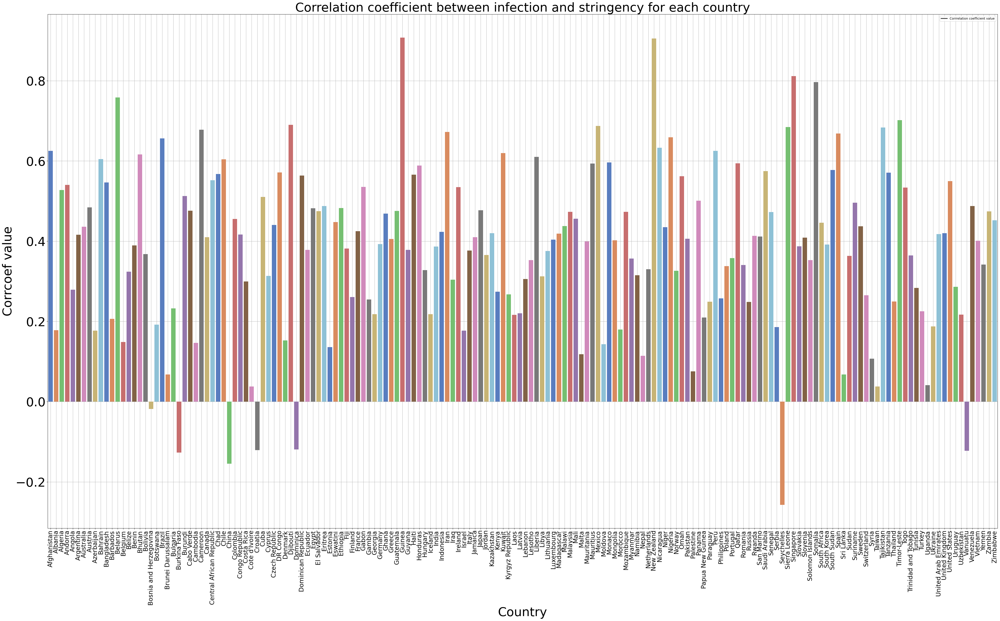

In [25]:
# Generate a bar plot showing the total number of measurements taken on each drug regimen using pyplot.
x_axis = np.arange(len(country_r_value_df))
tick_locations = [value for value in x_axis]

plt.figure(figsize=(55,30))

sns.barplot(x= "standard_names", y = "corrcoef", data = country_r_value_df, palette = "muted" , zorder = 3)
# plt.bar(x_axis, country_r_value_df["corrcoef"], color='blue', align="center", width = 0.52, zorder = 3)
plt.xticks(tick_locations, country, rotation="vertical" , fontsize =20)

# Set limits for x & y axes
# plt.xlim(-0.55, len(x_axis)-0.45)
# plt.ylim(0, max(country_r_value_df["corrcoef"])*1.05)

# Set labels for axes & title for the chart
plt.title("Correlation coefficient between infection and stringency for each country", fontsize =40)
plt.xlabel("Country", fontsize =40)
plt.ylabel("Corrcoef value", fontsize =40)

# Creating and displaying legend
column_name = ["Corrrelation coefficient value"]
plt.legend(column_name,loc="best")
plt.grid(zorder=0)
plt.yticks(fontsize = 40)
# Display the plot
plt.savefig("outputs/bar_chart_corrcoef.png")
plt.show()

# Linear regression using matplotlib

In [26]:
# Define function for calculating linear regression and scatter plot with linear regression plot
def linear_regression_sample(x,y,z, colx,coly):
#     print(f"The correlation coefficient of {country} is : {np.nan_to_num(round(st.pearsonr(x, y)[0],4))}")
    (slope, intercept, rvalue, pvalue, stderr) = linregress(x, y)
#     print(f"The correlation coefficient of {country} is : {rvalue}")
    regress_values = x * slope + intercept
    line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
    plt.scatter(x, y, c = "lightblue", edgecolor = "black")
    plt.plot(x,regress_values,"r-")
    plt.title(f"correlation value: {rvalue}")
    plt.ylabel(coly)
    plt.xlabel(colx)
    plt.grid(alpha = .2)
    for i, txt in enumerate(z):
        plt.annotate(txt, (x[i], y[i]))
    return line_eq

# Define a fuction for annotating
def plot_annotate(line_eq, a, b):
    plt.annotate(line_eq,(a,b),fontsize=10,color="black")


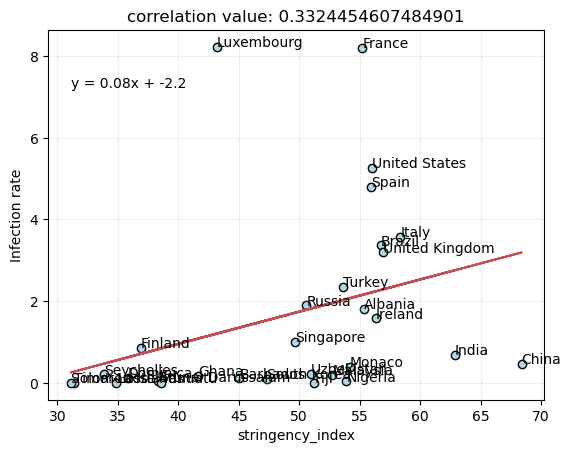

In [27]:
x = sample["stringency_index"]
y = sample["Infection_rate_f"]
z = sample["standard_names"]
colx = "stringency_index"
coly = "Infection rate"
a = x.min()
b = y.max()
line_eq = linear_regression_sample(x,y,z, colx, coly)
plot_annotate(line_eq,a,y.max() -1)

# Trend analysis using Matplotlib

In [28]:
# Define function for calculating linear regression and scatter plot with linear regression plot
def linear_regression(x,y,country):
#     print(f"The correlation coefficient of {country} is : {np.nan_to_num(round(st.pearsonr(x, y)[0],4))}")
    (slope, intercept, rvalue, pvalue, stderr) = linregress(x, y)
    print(f"The correlation coefficient of {country} is : {rvalue}")
    regress_values = x * slope + intercept
    line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
    plt.scatter(x, y, c = "lightblue", edgecolor = "black")
    plt.plot(x,regress_values,"r-")
    plt.title(f"{country}'s correlation value: {rvalue}")
    plt.ylabel("Infection Rate")
    plt.xlabel("Stringency Index")
    plt.grid(alpha = .2)
    return line_eq

# Define a fuction for annotating
def plot_annotate(line_eq, a, b):
    plt.annotate(line_eq,(a,b),fontsize=15,color="black")

In [29]:
def ln_rg_country(country):
    
    x = ultimate_no_null_df["stringency_index"].loc[ultimate_no_null_df["standard_names"] == country]
    y = ultimate_no_null_df["Infection_rate"].loc[ultimate_no_null_df["standard_names"] == country]\
            .str.rstrip('%').astype('float')
    a = x.min()
    b = y.max()
    line_eq = linear_regression(x,y, country)
    
    plot_annotate(line_eq, a, b)
#     plt.savefig(f"Images/{country}_lin_reg_chart.png")
    plt.show()

In [30]:
def line_plots(country):    
    months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    num_rcd = len(ultimate_no_null_df.loc[ultimate_no_null_df["standard_names"] == country])
    x_axis= range(1,num_rcd+1)
    tick_locations = [value for value in x_axis]
    y1 = ultimate_no_null_df["Confirmed"].loc[ultimate_no_null_df["standard_names"] == country]
    y2 = ultimate_no_null_df["stringency_index"].loc[ultimate_no_null_df["standard_names"] == country]
    y3 = ultimate_no_null_df["Infection_rate"].loc[ultimate_no_null_df["standard_names"] == country]\
            .str.rstrip('%').astype('float')
    max_count = y1.max()
    plt.rcdefaults()
    fig,ax1 = plt.subplots()
    plt.grid(alpha = .5, zorder = 0)
#     sns.set_palette("PuBuGn_d")
    data = ultimate_no_null_df.loc[ultimate_no_null_df["standard_names"] == country]
    ax1.set_xlabel("Month", fontsize =16)
    
#     ax1 = sns.lineplot(x= "month", y = "Confirmed", data = data , zorder = 3, palette='red')
    plt.plot(x_axis, y3, color='orange', linewidth=2, markersize=12, label = "Infection rate")
    plt.legend(loc='best')
    plt.xlim(0,13)
    plt.xlabel("2020")
    plt.ylabel("Infection rate")
    plt.title(f"{country} Covid confirmed trend for 2020")
    plt.xticks(tick_locations, months[:num_rcd], rotation="vertical")
#     if max_count >= 1000000:
#         ax1.set_ylabel("Confirmed in millions", fontsize =16)
   
        
    ax2 = ax1.twinx()
#     sns.set_palette("pastel")    
#     ax2 = sns.lineplot(x= "month", y = "stringency_index", data = data , zorder = 3, palette='blue').set_title(f"Confirmed vs. Stringency Index for {country}")
    plt.plot(x_axis, y2, color='blue', linewidth=2, markersize=12, label = "Stringency")
    
    plt.legend(loc='lower right')
    plt.ylim(0,100)
    plt.ylabel("Stringency (%)")
    plt.tight_layout()
    plt.savefig(f"outputs/{country}_line_chart.png")
    plt.show()

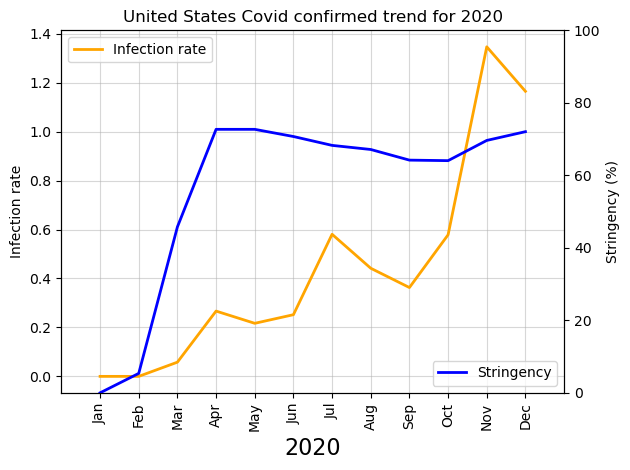

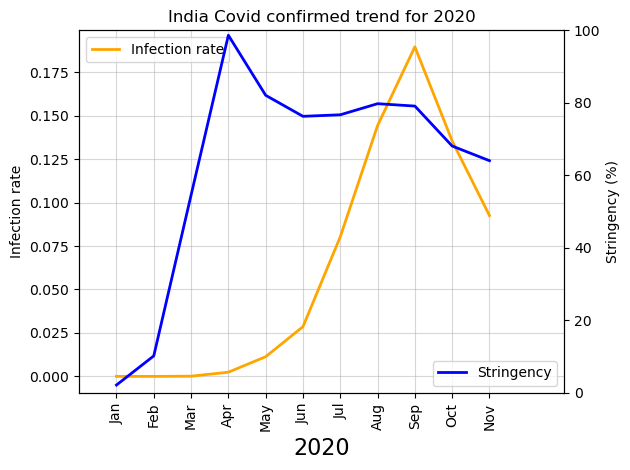

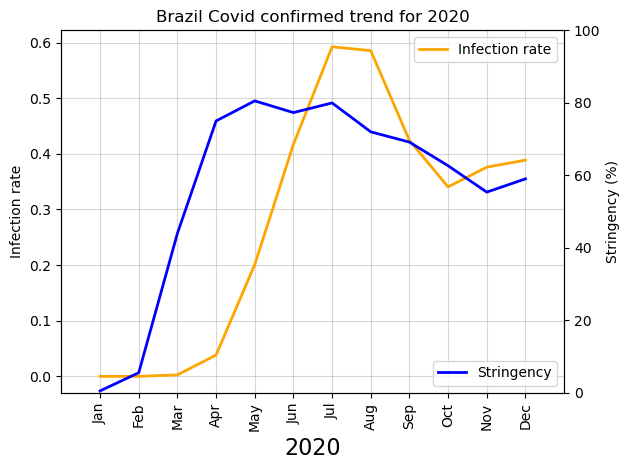

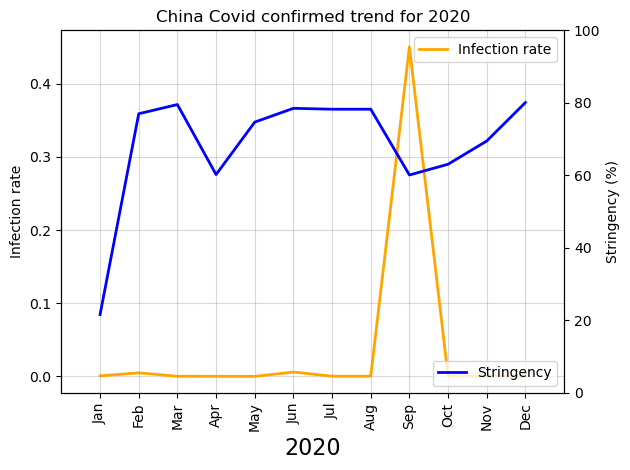

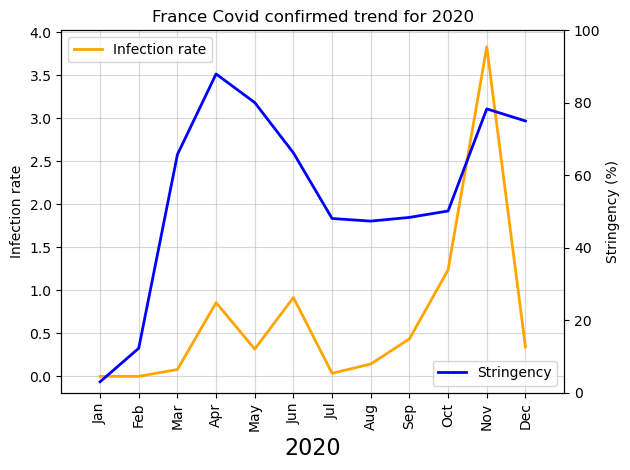

...

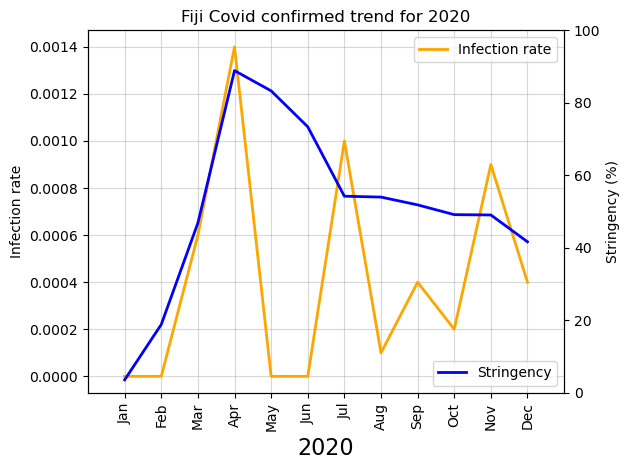

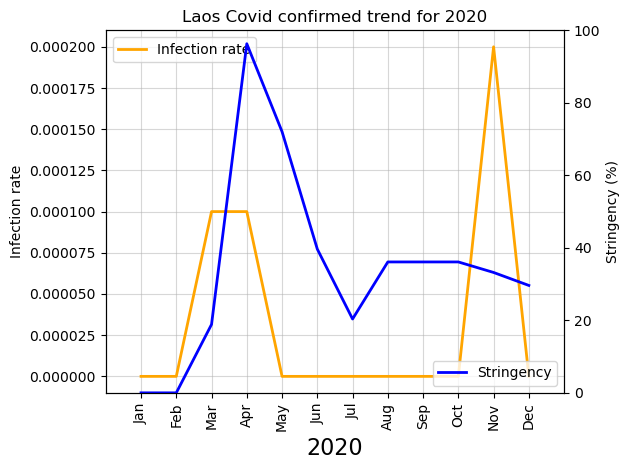

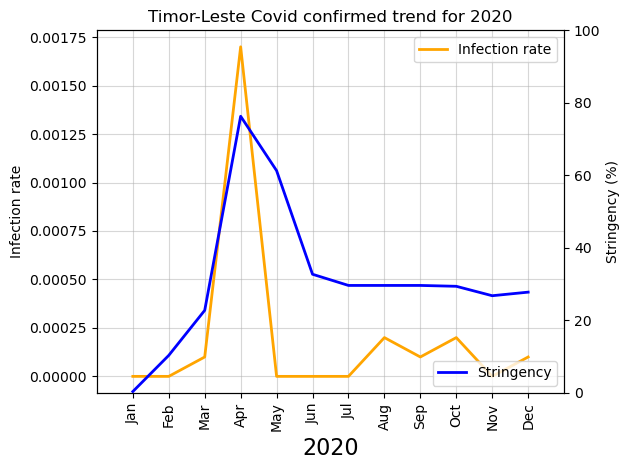

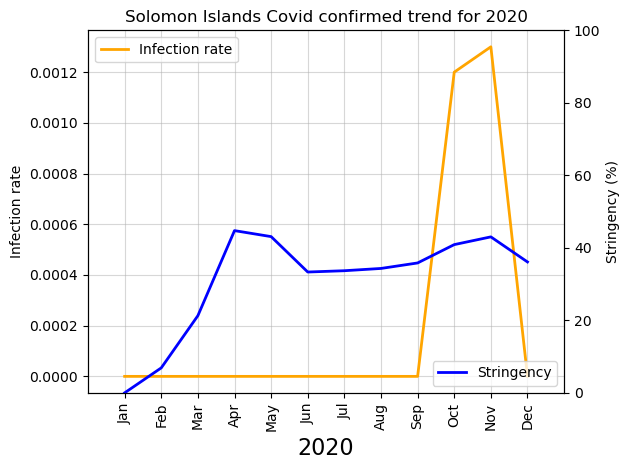

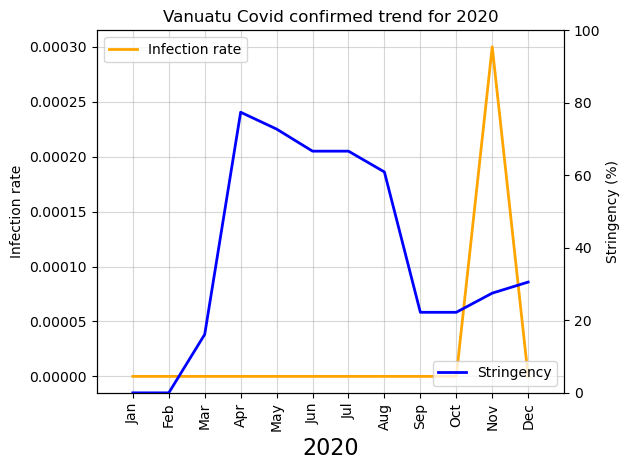

In [31]:
for i in range(len(sample)):
    country = sample.iloc[i,0]
#     line_plots(country)
#     ln_rg_country(country)
    line_plots(country)

# Pandas profiling

In [32]:
# Perform data profiling
import pandas_profiling as pp
profile_report = pp.ProfileReport(final_df)
profile_report.to_file("outputs/final_profiling.html")
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]